<br>
<br>
<font size='6'><u><b>Large Scale Structure of the Universe</b></u></font>
<br>

##### Written by Stephanie Juneau, NOIRLab, with contributions from Leah Fulmer & Gautham Narayan
##### Revised by Andres Jaramillo (last updated on 2022-09-19)

This notebook is interactive, and we will use it to learn and explore the distribution of galaxies in the universe. We follow a similar approach as other notebooks you might have used.

Feel comfortable to ask questions as you go along!
___

# Table of Contents

* [How to Use This Notebook](#How-to-Use-This-Notebook)
* [Pre-Activity Setup](#Pre-Activity-Setup)
* [Activity 1: How Far Away are Galaxies?](#Activity-1:-How-Far-Away-are-Galaxies?)
    * [Part 1.1: Plot a Reference Spectrum](#Part-1.1:-Plot-a-Reference-Spectrum)
    * [Part 1.2: Plot a Galaxy Spectrum](#Part-1.2:-Plot-a-Galaxy-Spectrum)
    * [Part 1.3: Measure Redshifts](#Part-1.3:-Measure-Redshifts)
    * [Part 1.4: Mystery Galaxy](#Part-1.4:-Mystery-Galaxy)
    * [Part 1.5: Redshift Ruler](#Part-1.5:-Redshift-Ruler)
* [Activity 2: Look at the Position of Many Galaxies](#Activity-2:-Look-at-the-Position-of-Many-Galaxies)
    * [Part 2.1: Selecting Galaxies in a Region of the Sky](#Part-2.1:-Selecting-Galaxies-in-a-Region-of-the-Sky)
    * [Part 2.2: Adding the 3rd Dimension](#Part-2.2:-Adding-the-3rd-Dimension)
    * [Part 2.3: Zooming In and Zooming Out](#Part-2.3:-Zooming-In-and-Zooming-Out)
___

# How to Use This Notebook

The webpage you are in is actually an app - much like the ones on your cellphone. This app consists of cells.

An *input* cell looks like a light grey box with an `In [ ]:` on its left. Input cells each contain code - instructions to make the computer do something.

To activate or select a cell, click anywhere inside of it.

<div class='alert alert-info'>
    <font size='3'><b>Select the cell below and read its contents.</b></font>
</div>

In [87]:
# Text that follows a "#" is known as a comment.
# Comments do not affect your code in any way.
# You should always read the comments at the top of each cell you interact with.
# Comments will be used to describe what the cell's code is actually doing.

To execute or run a selected cell, hit `[Shift + Enter]` on your keyboard.

<div class='alert alert-info'>
    <font size='3'><b>Select the cell below and read its contents. Then, run the cell.</b></font>
</div>

In [56]:
# Text that DOESN'T follow a "#" is considered code.
# Lines of code are instructions given to your computer.
# The line of code below is a "print" statement.
# A print statement literally prints out the text between its quotes.

print("Congrats! You have successfully run your first cell!")

Congrats! You have successfully run your first cell!


Running a cell creates an *output* directly below it. An output can be some text, a graph, an interactive slider, or even nothing at all! For that last case, you know you have run a cell when the `In [ ]:` becomes `In [#]:`, where "#" is any number.

You can learn more about how Jupyter notebooks work at https://try.jupyter.org/
___

# Pre-Activity Setup

In order for any of the activities to work properly, you must import the libraries needed for the code in this notebook.

<div class='alert alert-info'>
    <font size='3'><b>Select and run the cell below.</b></font>
</div>

In [ ]:
"""Import libraries.

Here, you are importing the libraries needed for this notebook. These libraries set up the plotting environment in
your browser.
"""

import numpy as np

%matplotlib widget
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.path as mpath
from mpl_toolkits.mplot3d import Axes3D

from IPython.core.display import Image, Markdown, display

from ipywidgets import *

from astroML.datasets import fetch_sdss_S82standards, fetch_sdss_specgals, fetch_sdss_spectrum, fetch_vega_spectrum
from astroML.plotting import MultiAxes

print('Done! You have successfully imported the libraries.')

Done! You have successfully imported the libraries.


___

# Activity 2: Look at the Position of Many Galaxies

Similarly to using coordinates of latitude and longitude, the coordinates on the sky are defined onto a sphere. They are called **RA** (Right Ascension) and **Dec** (Declination). There are two illustrations below of these coordinate systems.

<figure>
    <center>
        <br>
        <img src='http://voyages.sdss.org/wp-content/uploads/2015/10/pre-flight-celestial-sphere.jpg', width='300'>
        <br>
        <figcaption>
            <font color='grey'>
                <b>Figure 4:</b>
                Illustration of the celestial coordinate system with RA and Dec. You can read <a href='http://dev.skyserver.sdss3.org/voyages/pre-flight/ra-and-dec.aspx'>here</a> for an explanation by the SDSS team.
            </font>
        </figcaption>
    </center>
</figure>

<figure>
    <center>
        <br>
        <img src='https://upload.wikimedia.org/wikipedia/commons/9/98/Ra_and_dec_on_celestial_sphere.png', width='300'>
        <br>
        <figcaption>
            <font color='grey'>
                <b>Figure 5:</b>
                Illustration of the celestial coordinate system with RA and Dec. You can read on Wikipedia about <a href='https://en.wikipedia.org/wiki/Right_ascension'>Right Ascension</a> and <a href='https://en.wikipedia.org/wiki/Declination'>Declination</a>.
            </font>
        </figcaption>
    </center>
</figure>

___

## Part 2.1: Selecting Galaxies in a Region of the Sky

Next, we will fetch the positions of galaxies on the sky, and plot their RA and Dec coordinates. Run the cells below to actually fetch the galaxy sample and plot their positions on the sky.

<div class='alert alert-info'>
    <h3 class='alert-heading'>Helpful Reminder(s)</h3>
    <ul>
        <li>Click anywhere inside of a cell to select it.</li>
        <li>Hit [Shift + Enter] to run a selected cell.</li>
    </ul>
</div>

Done retrieving the galaxy sample.

Range for RA values: 0.001    360.0
Range for DEC values: -11.25    70.29
Range for RA values after conversion: -179.999    179.997


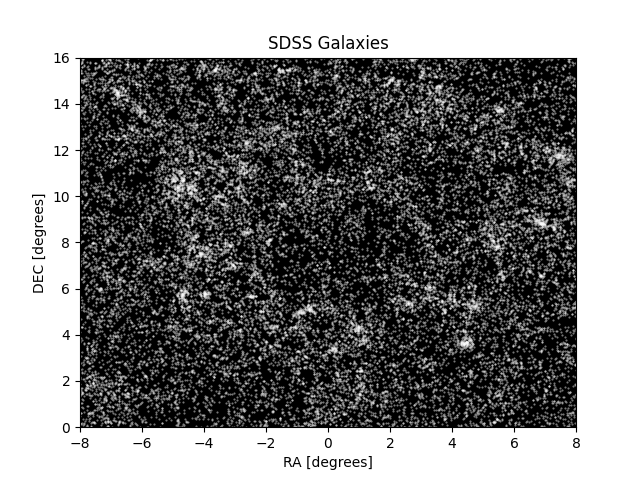

In [10]:
"""Fetch and plot a section of the sky from the SDSS data."""

# Fetch the SDSS sata.
data = fetch_sdss_specgals()
print('Done retrieving the galaxy sample.\n')

# Define the coordinate variables for plotting.
RA = data['ra']
DEC = data['dec']
print('Range for RA values: %s    %s' %(np.round(np.amin(RA),3),np.round(np.amax(RA))))
print('Range for DEC values: %s    %s' %(np.round(np.amin(DEC),2),np.round(np.amax(DEC),2)))

# Convert RA range to [-180, 180] instead of [0, 360].
RA -= 180
print('Range for RA values after conversion: %s    %s' %(np.round(np.amin(RA),3),np.round(np.amax(RA),3)))

# Plot the RA/DEC positions.
fig = plt.figure()
ax = fig.add_subplot(111, fc='black')
ax.set_title('SDSS Galaxies')
ax.set_xlabel('RA [degrees]')
ax.set_ylabel('DEC [degrees]')
ax.set_xlim(-8, 8)  # Range for the x axis (horizontal)
ax.set_ylim(0, 16)  # Range for the y axis (vertical)
ln, = ax.plot(RA, DEC, c='white', marker='.', ms=1, ls='', alpha=0.5)
fig.canvas.toolbar_position = 'bottom'

___

## Part 2.2: Adding the 3rd Dimension

We saw before that in order to know the full distribution in 3D, we need to know how far away the galaxies are located. Here, we will add the information from the redshift.

> <u><b>Remember:</b></u> The larger the redshift, the further away the galaxy!

First, we will plot all galaxies in white, and show galaxies that have approximately the same redshift in yellow. In this first example, we will select for values of redshift with a slider widget. This is done by computing galaxies in a window of $\pm 0.01$ around the value of the redshift slider. We call this an interval of redshift.

Done retrieving the galaxy sample.



Box(children=(FloatSlider(value=0.02, description='Redshift:', layout=Layout(width='initial'), max=0.2, min=0.…

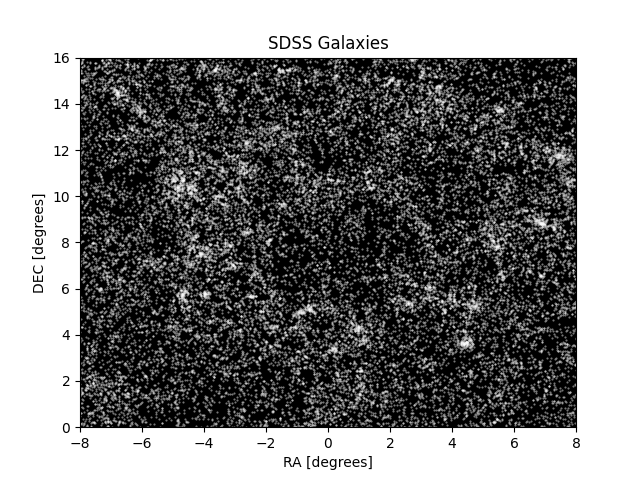

In [11]:
"""Highlight distant galaxies based on redshift."""

# Fetch the SDSS data.
data = fetch_sdss_specgals()
print('Done retrieving the galaxy sample.\n')

# Define the coordinate variables for plotting.
RA = data['ra']
DEC = data['dec']

# Convert RA range to [-180, 180] instead of [0, 360].
RA -= 180

# Define redshift variable z.
z = data['z']

# Select a redshift range to highlight.
rz = np.where(np.absolute(z) < 0.01)

# Plot the RA/DEC positions.
fig = plt.figure()
ax = fig.add_subplot(111, fc='black')
ax.set_title('SDSS Galaxies')
ax.set_xlabel('RA [degrees]')
ax.set_ylabel('DEC [degrees]')
ax.set_xlim(-8, 8)  # Range for the x axis (horizontal)
ax.set_ylim(0, 16)  # Range for the y axis (vertical)
ln1, = ax.plot(RA, DEC, c='white', marker='.', ms=1, ls='', alpha=0.5)
ln2, = ax.plot(RA[rz], DEC[rz], c='yellow', marker='.', ms=3, ls='', alpha=1)  # rz selected galaxies
fig.canvas.toolbar_position = 'bottom'

# Create the interactive widget.
def f(w3):
    rz = np.where(np.absolute(z-w3) < 0.01)
    ln2.set_data([RA[rz], DEC[rz]])

w3 = FloatSlider(description='Redshift:', value=0, min=0.02, max=0.2, step=0.01, layout=layout, style=style)
interactive(f, w3=w3)
Box([w3], layout=box_layout)

Now, instead of showing just one interval of redshift in yellow, we will show the redshift of each galaxy color-coded. Each galaxy is shown with a dot, and each dot will have a color corresponding to the redshift: purple/blue colors mean a low redshift like between $0$ and $0.05$, then green/yellow mean slightly higher redshift like $0.1$, and so on until the higher redshift shown here of $0.2$ in red. Remember that this means that points with exactly the same color are at the same distance from us!

-------------------------------------
Number of galaxies in the plot above: 48148


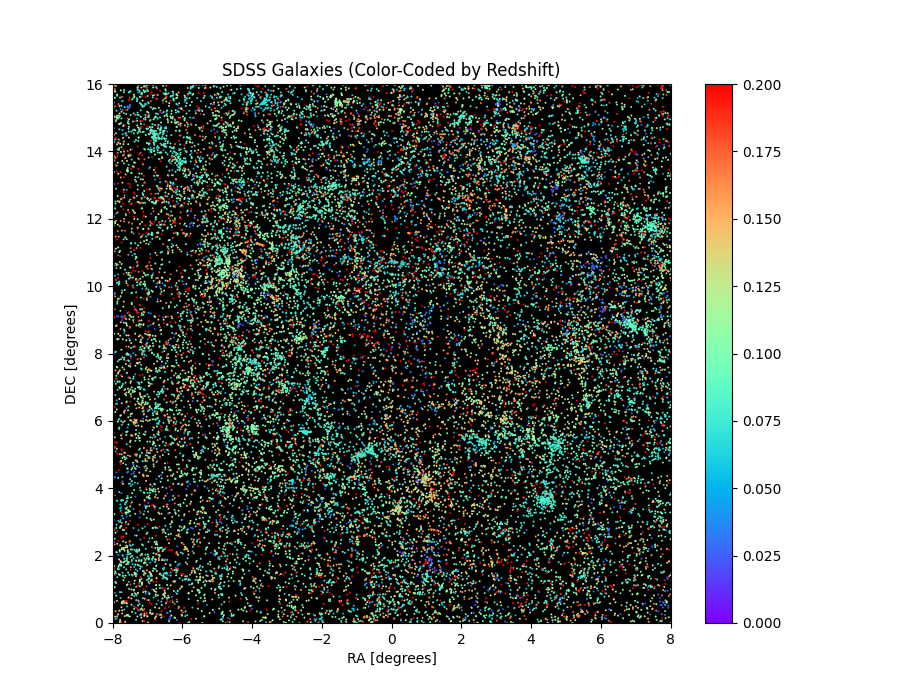

In [12]:
"""Color-code distant galaxies based on redshift."""

# Fetch the SDSS data.
data = fetch_sdss_specgals()

# Define the coordinate variables for plotting.
RA = data['ra']
DEC = data['dec']

# Convert RA range to [-180, 180] instead of [0, 360].
RA -= 180

# Define redshift variable z.
z = data['z']

# Plot the RA/DEC positions.
fig = plt.figure(figsize=(9,7))
ax = fig.add_subplot(111, fc='black')
ax.set_title('SDSS Galaxies (Color-Coded by Redshift)')
ax.set_xlabel('RA [degrees]')
ax.set_ylabel('DEC [degrees]')
ax.set_xlim(-8, 8)
ax.set_ylim(0, 16)
ln = ax.scatter(RA, DEC, s=2, c=z, lw=0, cmap=cm.rainbow, vmin=0, vmax=0.2)
fig.colorbar(ln)  # Color bar
fig.canvas.toolbar_position = 'bottom'

# Count how many galaxies are within the plot.
points = np.column_stack([RA, DEC])
verts = np.array([[-8, -8, 8, 8], [0, 16, 16, 0]]).T
path = mpath.Path(verts)
points_inside = points[path.contains_points(points)]
print('-------------------------------------')
print('Number of galaxies in the plot above: %s' %np.count_nonzero(points_inside))

The color bar to the right-hand side shows the correspondence between color and redshift. As mentioned before, points with exactly the same color are at the same distance from us. Purple points are the closest to us, then blue, aqua, green and so on. Think about which galaxies/colors are near and which galaxies/colors are far.

<div class='alert alert-success'>
    <h3 class='alert-heading'>Quick Question(s)</h3>
    <ul>
        <li>Can you use this information to imagine the distribution of galaxies in 3D?</li>
        <li>Do you notice any structure together at the same distance from us?</li>
    </ul>
</div>

___

## Part 2.3: Zooming In and Zooming Out

Now, we will repeat the plots from Part 2.2 above, but with a zoom on a smaller region ("zooming in"), and then over a larger region ("zooming out").

-------------------------------------
Number of galaxies in the plot above: 3102


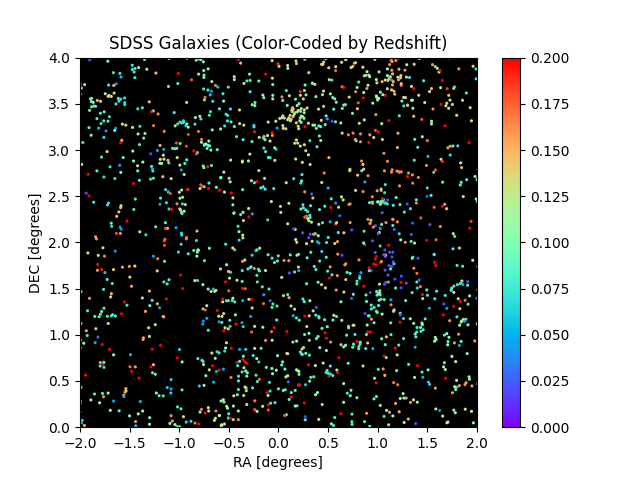

In [41]:
"""Color-code distant galaxies based on redshift (zoomed-in)."""

# Fetch the SDSS data.
data = fetch_sdss_specgals()

# Define the coordinate variables for plotting.
RA = data['ra']
DEC = data['dec']

# Convert RA range to [-180, 180] instead of [0, 360].
RA -= 180

# Define redshift variable z.
z = data['z']

# Plot the RA/DEC positions.
fig = plt.figure()
ax = fig.add_subplot(111, fc='black')
ax.set_title('SDSS Galaxies (Color-Coded by Redshift)')
ax.set_xlabel('RA [degrees]')
ax.set_ylabel('DEC [degrees]')
ax.set_xlim(-2, 2)
ax.set_ylim(0, 4)
ln = ax.scatter(RA, DEC, s=5, c=z, lw=0, cmap=cm.rainbow, vmin=0, vmax=0.2)
fig.colorbar(ln)  # Color bar
fig.canvas.toolbar_position = 'bottom'

# Count how many galaxies are within the plot.
points = np.column_stack([RA, DEC])
verts = np.array([[-2, -2, 2, 2], [0, 4, 4, 0]]).T
path = mpath.Path(verts)
points_inside = points[path.contains_points(points)]
print('-------------------------------------')
print('Number of galaxies in the plot above: %s' %np.count_nonzero(points_inside))

<div class='alert alert-success'>
    <h3 class='alert-heading'>Quick Question(s)</h3>
    <ul>
        <li>Do you see any interesting galaxy structures?</li>
        <li>What galaxy structures are closer/further from you?</li>
    </ul>
</div>

Now, let's step back and plot galaxies over a large region of the sky!

-------------------------------------
Number of galaxies in the plot above: 170274


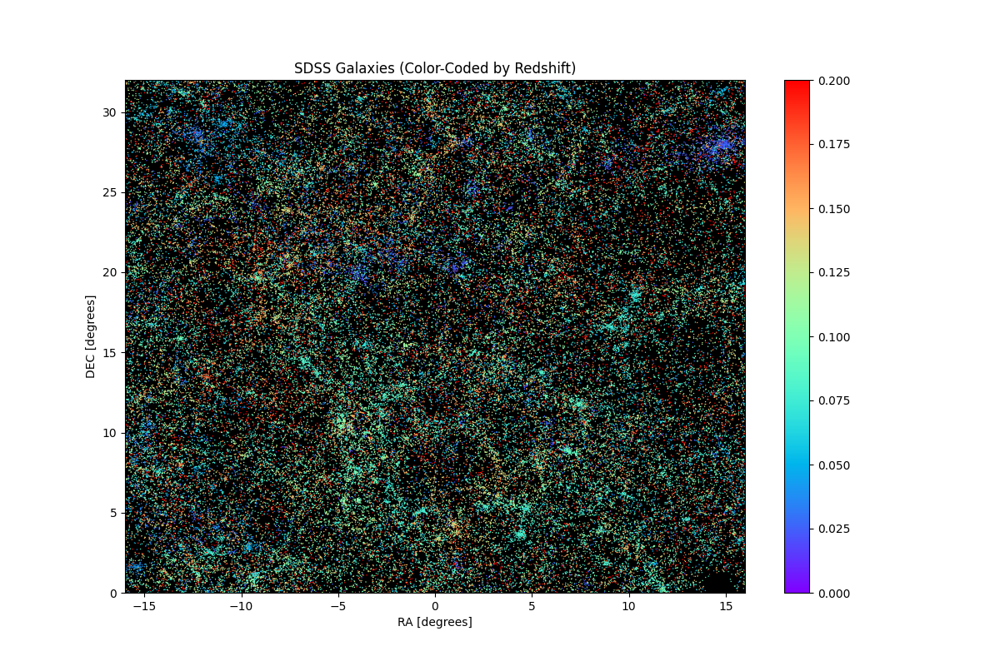

In [42]:
"""Color-code distant galaxies based on redshift (zoomed-out)."""

# Fetch the SDSS data.
data = fetch_sdss_specgals()

# Define the coordinate variables for plotting.
RA = data['ra']
DEC = data['dec']

# Convert RA range to [-180, 180] instead of [0, 360].
RA -= 180

# Define redshift variable z.
z = data['z']

# Plot the RA/DEC positions.
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111, fc='black')
ax.set_title('SDSS Galaxies (Color-Coded by Redshift)')
ax.set_xlabel('RA [degrees]')
ax.set_ylabel('DEC [degrees]')
ax.set_xlim(-16, 16)
ax.set_ylim(0, 32)
ln = ax.scatter(RA, DEC, s=1, c=z, lw=0, cmap=cm.rainbow, vmin=0, vmax=0.2)
fig.colorbar(ln)  # Color bar
fig.canvas.toolbar_position = 'bottom'

# Count how many galaxies are within the plot.
points = np.column_stack([RA, DEC])
verts = np.array([[-16, -16, 16, 16], [0, 32, 32, 0]]).T
path = mpath.Path(verts)
points_inside = points[path.contains_points(points)]
print('-------------------------------------')
print('Number of galaxies in the plot above: %s' %np.count_nonzero(points_inside))

<div class='alert alert-danger'>
    <h3 class='alert-heading'>Concluding Question(s)</h3>
    <ol>
        <li>How many times more galaxies are in the large (zoomed out) view relative to the small (zoomed in) view?</li>
        <li>How many times can you fit the small region within the large region? (Hint: compute the size from the axes)</li>
        <li>Are those two numbers above the same? What does it mean?</li>
        <li>What do you see now on the zoomed out view?</li>
        <li>Are those structures smaller or larger?</li>
    </ol>
</div>

___

For the excersizes below, please first change the type of the notebook cell back to "Code" *in the meny bar above).

# Cell for calulations (fill in numbers below otherwise it will not execute well!)

#1 How many times more galaxies in the large region relative to the small region?
Number_in_largest_region = 
Number_in_smallest_region =  
ratio = () / ()
print('Ratio of number of galaxies:', ratio)

#2 How many times can the small region fit within the large region? (hint: large region is 32 degrees on a side)
area_of_largest_region = 
area_of_smallest_region = 
ratio = () / ()
print('Ratio of areas on the sky:', ratio)

---
---

## USING plotly to try plotting RA, DEC and z as axis

By D. Herrera

In [68]:
import plotly
import plotly.graph_objs as go

plotly.offline.init_notebook_mode()
print('You have successfully imported plotly libraries')

You have successfully imported plotly libraries


In [81]:
# Fetch the SDSS data.
data = fetch_sdss_specgals()
# Define the coordinate variables for plotting.
RA = data['ra']
DEC = data['dec']

print('Range for RA values: %s    %s' %(np.round(np.amin(RA),3),np.round(np.amax(RA))))
print('Range for DEC values: %s    %s' %(np.round(np.amin(DEC),2),np.round(np.amax(DEC),2)))

# Convert RA range to [-180, 180] instead of [0, 360].
RA -= 180
print('Range for RA values after conversion: %s    %s' %(np.round(np.amin(RA),3),np.round(np.amax(RA),3)))
#DEC += 20
#print('Range for DEC values after conversion: %s    %s' %(np.round(np.amin(DEC),3),np.round(np.amax(DEC),3)))

randomids = np.random.choice(np.arange(RA.size),size=1000,replace=False)
ra_ = RA[randomids]
dec_ = DEC[randomids]
z_ = z[randomids]



Range for RA values: 0.001    360.0
Range for DEC values: -11.25    70.29
Range for RA values after conversion: -179.999    179.997


In [82]:
trace = go.Scatter3d(
    x = ra_,
    y = dec_,
    z = z_,
    mode = 'markers',
    marker = {
        'size'      : 3,
        'opacity'   : 0.7,
        'color'     : z_,
        'colorscale': 'Jet'
    }
)

In [83]:
layout = go.Layout(
    margin = {'l':0, 'r':0, 'b':0, 't':0},
    autosize = False,
    width = 800,
    height = 800
)

In [84]:
data = [trace]

In [85]:
plot_figure = go.Figure(data = data, layout = layout)

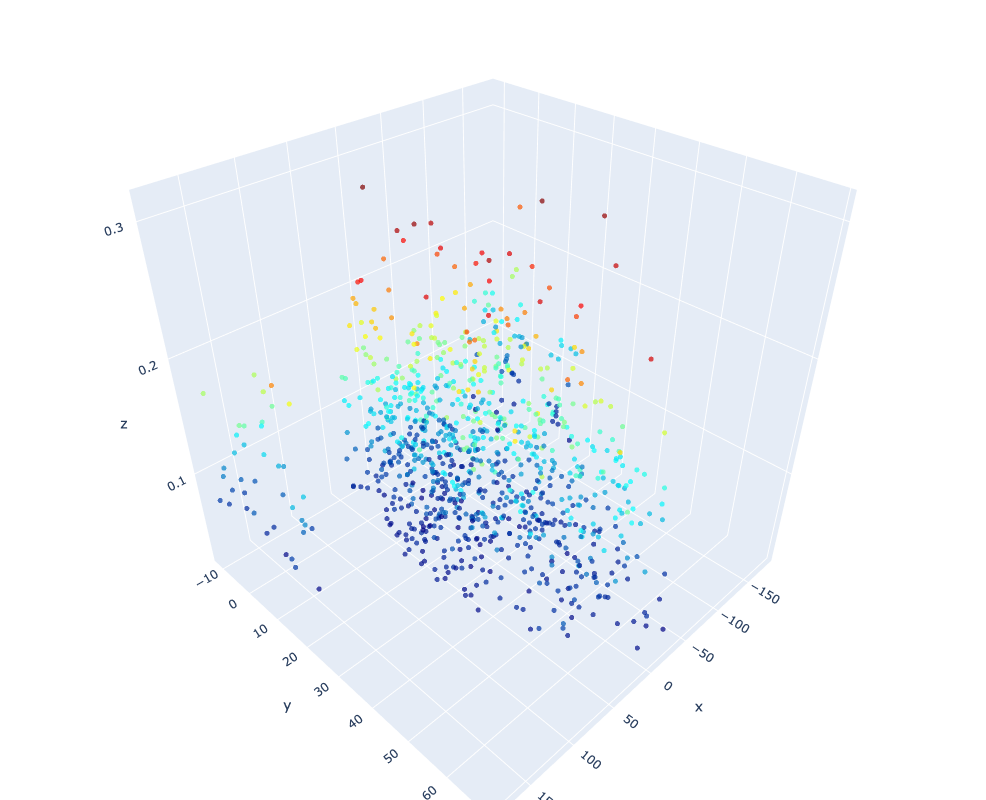

In [86]:
plotly.offline.iplot(plot_figure)